# Integrate multiple spatial transcriptomics datasets
## Import library

In [1]:
import stlearn as st
import scanpy as sc
import numpy as np

st.settings.set_figure_params(dpi=150)

## Read data

In this tutorial, we are using the Breast cancer datasets with 2 sections of block A.

Source: https://support.10xgenomics.com/spatial-gene-expression/datasets

In [2]:
block1 = st.Read10X("/afm01/UQ/Q1139/Duy/BCBA/")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [3]:
block2 = st.Read10X("/afm01/UQ/Q1139/Duy/BCBA_Section2/")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


## Processing data

In [4]:
# concatenate 2 samples
adata_concat = block1.concatenate(block2)

In [5]:
# Preprocessing
# Filter genes
sc.pp.filter_genes(adata_concat, min_cells=3)
# Normalize data
sc.pp.normalize_total(adata_concat, target_sum=1e4)
# Log transformation
sc.pp.log1p(adata_concat)
# Store raw data
adata_concat.raw = adata_concat
# Extract top highly variable genes
sc.pp.highly_variable_genes(adata_concat, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata_concat = adata_concat[:, adata_concat.var.highly_variable]
# Scale data
sc.pp.scale(adata_concat, max_value=10)

/home/uqdpham4/.conda/envs/stlearn/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [6]:
# Run dimensionality reduction
sc.pp.pca(adata_concat, n_comps=30, svd_solver='arpack')

## Run integration with harmony

In [7]:
# Prepare metadata and PCA
meta_data = adata_concat.obs
data_mat = adata_concat.obsm["X_pca"]

In [8]:
# Import and run harmony
import harmonypy as hm
ho = hm.run_harmony(data_mat, meta_data, "batch")

2022-01-31 19:15:28,174 - harmonypy - INFO - Iteration 1 of 10
2022-01-31 19:15:30,522 - harmonypy - INFO - Iteration 2 of 10
2022-01-31 19:15:33,014 - harmonypy - INFO - Iteration 3 of 10
2022-01-31 19:15:35,330 - harmonypy - INFO - Iteration 4 of 10
2022-01-31 19:15:37,102 - harmonypy - INFO - Iteration 5 of 10
2022-01-31 19:15:38,008 - harmonypy - INFO - Iteration 6 of 10
2022-01-31 19:15:38,805 - harmonypy - INFO - Iteration 7 of 10
2022-01-31 19:15:39,602 - harmonypy - INFO - Iteration 8 of 10
2022-01-31 19:15:40,416 - harmonypy - INFO - Iteration 9 of 10
2022-01-31 19:15:41,113 - harmonypy - INFO - Iteration 10 of 10
2022-01-31 19:15:41,800 - harmonypy - INFO - Stopped before convergence


In [9]:
# Mapping back the result to the adata object
adata_concat.obsm["X_pca"] = ho.Z_corr.T

## Perform clustering and visualize the results by UMAP

In [10]:
# Build KNN and run UMAP
sc.pp.neighbors(adata_concat, n_pcs =30)
sc.tl.umap(adata_concat)

In [11]:
# Run clustering with leiden
sc.tl.leiden(adata_concat, resolution=0.4)

... storing 'feature_types' as categorical
... storing 'genome' as categorical


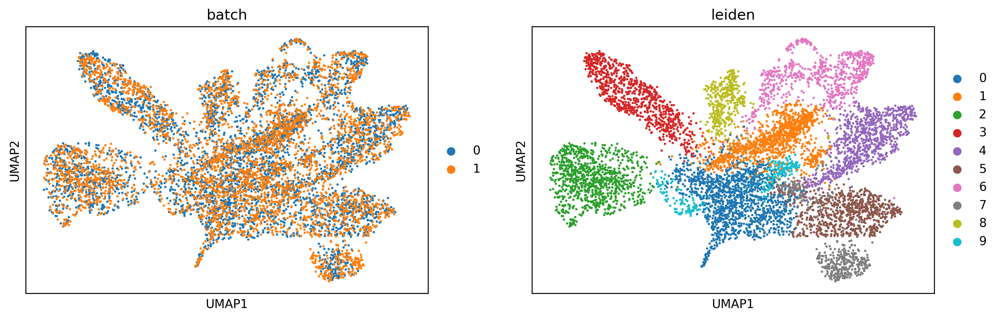

In [12]:
# Plotting UMAP
sc.pl.umap(adata_concat, color=["batch","leiden"])

## Map the result back to the original samples


In [13]:
st.settings.set_figure_params(dpi=150)
# Map leiden clusteirng result to block A section 1
block1.obs["leiden"] = adata_concat.obs[adata_concat.obs.batch=="0"].leiden.values

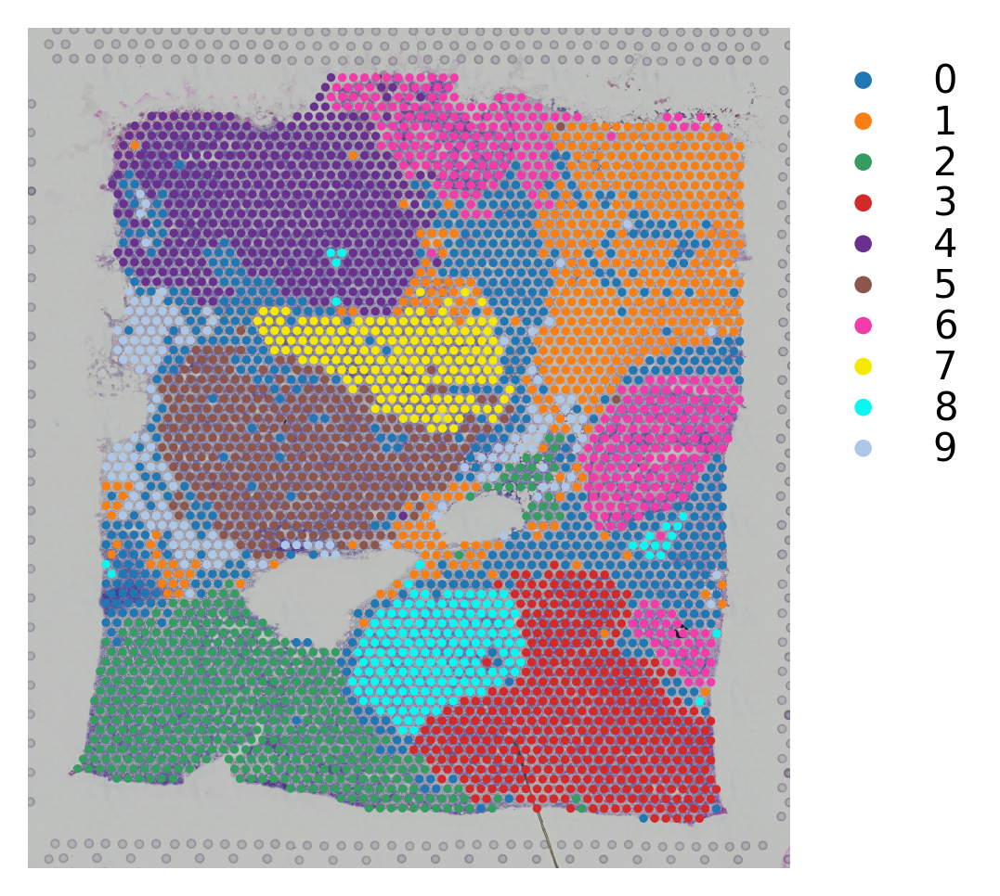

In [14]:
# Plotting the clusteirng result
st.pl.cluster_plot(block1,use_label="leiden")

In [15]:
# Map leiden clusteirng result to block A section 2
block2.obs["leiden"] = adata_concat.obs[adata_concat.obs.batch=="1"].leiden.values

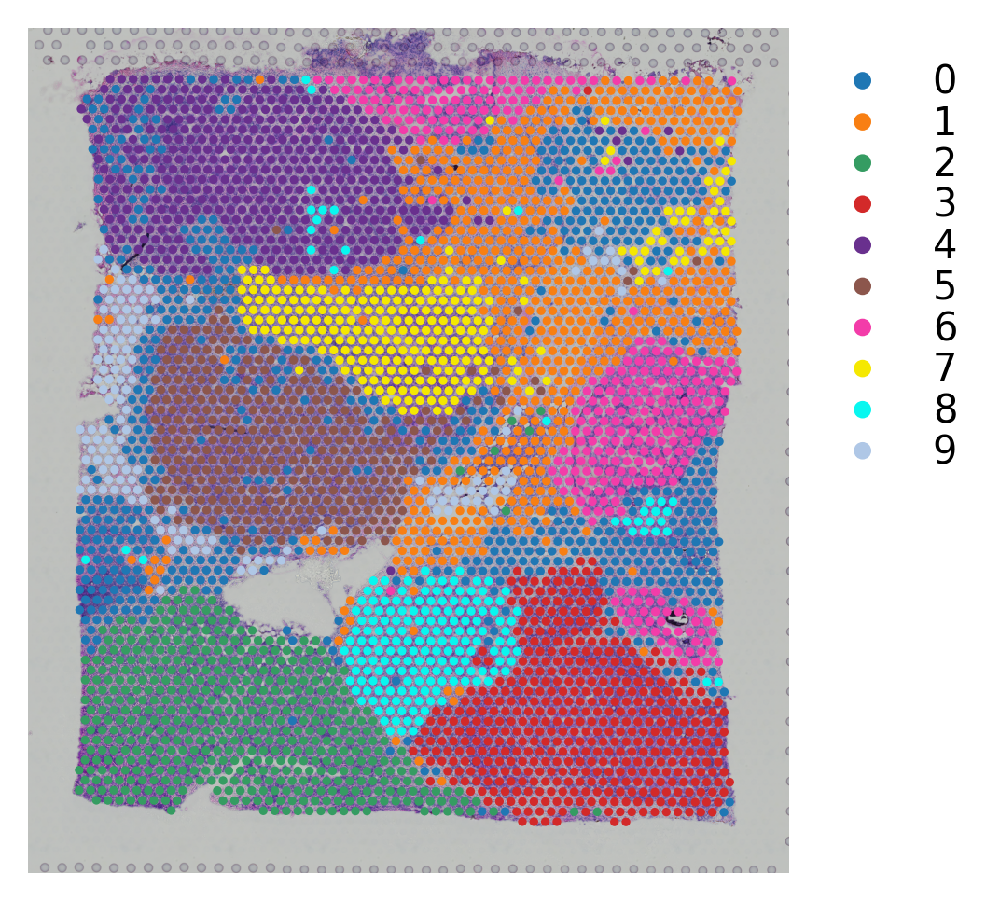

In [16]:
# Plotting the clusteirng result
st.pl.cluster_plot(block2,use_label="leiden")

## Manually combine the images and change the coordinates

This is a way to plotting 2 samples in the same adata object. 

In [17]:
# Initialize the spatial 
adata_concat.uns["spatial"] = block1.uns["spatial"]

In [18]:
# Horizontally stack 2 images from section 1 and section 2 datasets
combined = np.hstack([block1.uns["spatial"]["V1_Breast_Cancer_Block_A_Section_1"]["images"]["hires"],
                      block2.uns["spatial"]["V1_Breast_Cancer_Block_A_Section_2"]["images"]["hires"]])

In [19]:
# Map the image to the concatnated adata object
adata_concat.uns["spatial"]["V1_Breast_Cancer_Block_A_Section_1"]["images"]["hires"] = combined

In [20]:
# Manually change the coordinate of spots to the right
adata_concat.obs.loc[adata_concat.obs.batch == "1","imagecol"] = adata_concat.obs.loc[adata_concat.obs.batch == "1","imagecol"].values + 2000

In [21]:
# Change to the .obsm["spatial"]
factor = adata_concat.uns["spatial"]["V1_Breast_Cancer_Block_A_Section_1"]["scalefactors"]["tissue_hires_scalef"]
adata_concat.obsm["spatial"] = adata_concat.obs[["imagecol","imagerow"]].values / factor

In [22]:
st.settings.set_figure_params(dpi=200)

/home/uqdpham4/.conda/envs/stlearn/lib/python3.8/site-packages/stlearn/plotting/classes.py:165: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, aspect=10, shrink=0.5, cmap=self.cmap)


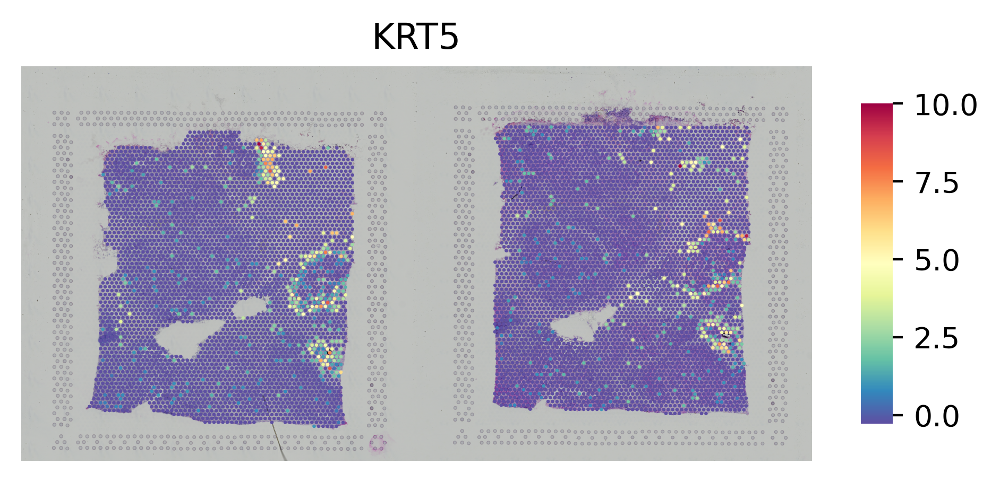

In [23]:
# Plot the gene
st.pl.gene_plot(adata_concat, gene_symbols="KRT5",crop=False, size=1.4,cell_alpha=1)

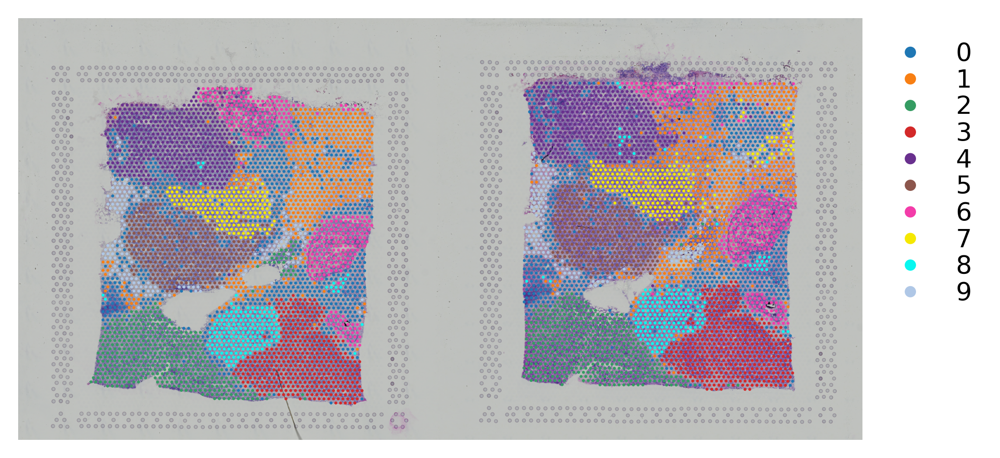

In [24]:
# Plot the clusters
st.pl.cluster_plot(adata_concat, use_label="leiden", crop=False, size=1.4,cell_alpha=1)